# Principal Component Analysis (PCA)

In [1]:
# Importing Libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from scipy.linalg import eigh
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Loading MNIST Dataset

mnist = pd.read_csv('mnist_train.csv')
mnist.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [3]:
#store the label in seperate variable
lab = mnist['label']

# drop label and store date in data
data = mnist.drop('label',axis =1)

In [4]:
#Check the shape of data
print(lab.shape)
print(data.shape)

(42000,)
(42000, 784)


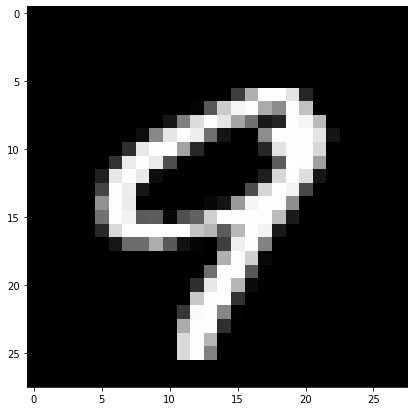

In [5]:
# Display a number
plt.figure(figsize=(7,7))
idx = 100

grid_data = data.iloc[idx].values.reshape(28,28)
plt.imshow(grid_data, interpolation = "none", cmap = "gray")
plt.show()

In [6]:
print(lab[idx])

9


In [7]:
# Standardizing the data
standardized_data = StandardScaler().fit_transform(data)
print(standardized_data.shape)

(42000, 784)


In [8]:
# Calculating the Covariance
data = standardized_data
covar_matrix = np.matmul(data.T,data)
print("The shape of Covarince matrix = ",covar_matrix.shape)

The shape of Covarince matrix =  (784, 784)


In [9]:
# Finding eign values and eigen vectors
values , vectors = eigh(covar_matrix , eigvals=(782,783))
print("shape",vectors.shape)
vectors = vectors.T
print("updated shape",vectors.shape)

shape (784, 2)
updated shape (2, 784)


In [10]:
# projecting original data to plane
new_coordinates = np.matmul(vectors,data.T)
print("resultant new datapoints shape",vectors.shape ,"X", data.T.shape)


resultant new datapoints shape (2, 784) X (784, 42000)


In [11]:
# Appending label to 2d projected data
new_coordinates = np.vstack((new_coordinates,lab)).T

In [12]:
# Creating new dataframe for plotting labelled points
dataframe = pd.DataFrame(data=new_coordinates, columns=("1st Principal" , "2nd Principal" , "labels"))
print(dataframe.head())

   1st Principal  2nd Principal  labels
0      -5.226445      -5.140478     1.0
1       6.032996      19.292332     0.0
2      -1.705813      -7.644503     1.0
3       5.836139      -0.474207     4.0
4       6.024818      26.559574     0.0


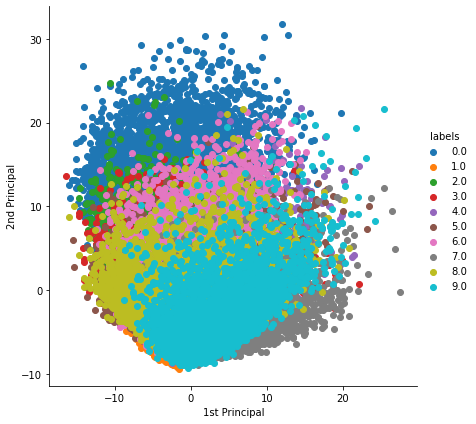

In [13]:
# Plotting 2d data using seaborn
sns.FacetGrid(dataframe , hue ="labels", size = 6).map(plt.scatter, "1st Principal" , "2nd Principal").add_legend()
plt.show()

In [14]:
fig = px.scatter(dataframe, x="1st Principal", y="2nd Principal", color="labels")
fig.show()

# PCA using Scikit-Learn

In [15]:
# Initializing the PCA
from sklearn import decomposition
pca = decomposition.PCA()

In [16]:
# Configuring the parameters
# Number of components = 2
pca.n_components = 2
pca_data = pca.fit_transform(data)

print("shape of pca_reduced =", pca_data.shape)

shape of pca_reduced = (42000, 2)


In [17]:
# Appending label to 2d projected data
pca_data = np.vstack((pca_data.T,lab)).T

In [18]:
# Creating new dataframe for plotting labelled points
pca_dataframe = pd.DataFrame(data=pca_data, columns=("1st Principal" , "2nd Principal" , "labels"))

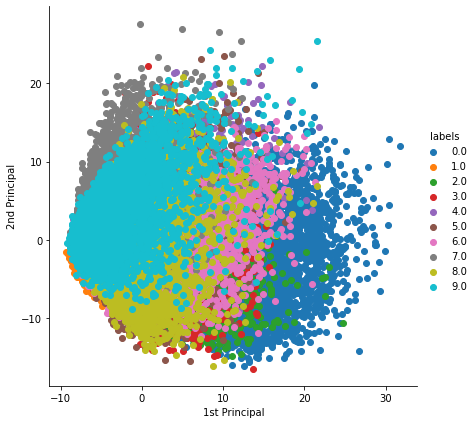

In [19]:
# Plotting 2d data using seaborn
sns.FacetGrid(pca_dataframe , hue ="labels", size = 6).map(plt.scatter, "1st Principal" , "2nd Principal").add_legend()
plt.show()

In [20]:
fig = px.scatter(pca_dataframe, x="1st Principal", y="2nd Principal", color="labels")
fig.show()

In [21]:
print(lab.shape)
print(data.shape)

(42000,)
(42000, 784)


## Logistic Regression

In [22]:
# Splitting Dataset into Training and Test Datasets

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

X = mnist.drop(['label'], axis=1)
Y = mnist['label']

x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size = 0.3, random_state = 100)

print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(29400, 784)
(29400,)
(12600, 784)
(12600,)


In [23]:
# Model Fitting
lr = LogisticRegression()
lr_model = lr.fit(x_train, y_train)

In [24]:
predictions = lr.predict(x_test)
predictions

array([5, 0, 2, ..., 5, 7, 7], dtype=int64)

In [25]:
#Model Performance
score = lr.score(x_test, y_test)
print(score)

0.9111111111111111


## SVM

In [26]:
from sklearn.svm import SVC

# linear model

model_linear = SVC()
model_linear.fit(x_train, y_train)

# predict
y_pred = model_linear.predict(x_test)

#Model Performance
score = model_linear.score(x_test, y_test)
print(score)

0.9738095238095238


In [27]:
# non-linear model
# using rbf kernel, C=1, default value of gamma

# model
non_linear_model = SVC(kernel='rbf')

# fit
non_linear_model.fit(x_train, y_train)

# predict
y_pred = non_linear_model.predict(x_test)

In [28]:
rbf_score = non_linear_model.score(x_test, y_test)
print(rbf_score)

0.9738095238095238
